# Stock Market Visualization

In [1]:
# Import Modules

import numpy as np
import pandas as pd
import os
import random
import copy
import matplotlib.pyplot as plt


## Read the data from Stock folder

### Check how much data is available? 

In [2]:
list = os.listdir("./Stocks/")
number_files = len(list)
print(number_files)

7196


### Choose 8 random stock data for analysis

In [3]:
#filenames = [x for x in os.listdir("./Stocks/") if x.endswith('.txt') and os.path.getsize(x) > 0]
filenames = random.sample([x for x in os.listdir("./Stocks/") if x.endswith('.txt') 
                           and os.path.getsize(os.path.join("./Stocks",x)) > 0], 8)
print(filenames)

['sojb.us.txt', 'cxrx.us.txt', 'pfbi.us.txt', 'pslv.us.txt', 'pcar.us.txt', 'cha.us.txt', 'nee_q.us.txt', 'enfc.us.txt']


### Read data into dataframes

In [4]:
data = []
for filename in filenames:
    df = pd.read_csv(os.path.join("./Stocks",filename), sep=',')
    label, _, _ = filename.split(sep='.')
    df['Label'] = label
    df['Date'] = pd.to_datetime(df['Date'])

    data.append(df)

In [5]:
data[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label
0,2016-09-21,23.947,24.005,23.909,23.996,1046603,0,sojb
1,2016-09-22,24.024,24.053,23.976,23.996,2044432,0,sojb
2,2016-09-23,24.015,24.053,23.986,24.053,779055,0,sojb
3,2016-09-26,24.033,24.062,23.976,24.033,701203,0,sojb
4,2016-09-27,24.015,24.159,24.015,24.159,837559,0,sojb


In [6]:
print(len(data))

8


## Add various Technical Indicators in the dataframe

There are many types of Technical Indicators. 
The Technical Indicators we are considering are:
- RSI, Volume (plain), Bollinger Bands, Aroon, Price Volume Trend, acceleration bands
- Stochastic, Chaikin Money Flow, Parabolic SAR, Rate of Change, Volume weighted average Price, momentum
- Commodity Channel Index, On Balance Volume, Keltner Channels, Triple Exponential Moving Average, Normalized Averager True Range ,directional movement indicators
- MACD, Money flowindex , Ichimoku, William %R, Volume MINMAX, adaptive moving average

In [7]:
TechIndicator = copy.deepcopy(data)

### Calculation of Relative Strength Index (RSI)

In [8]:
# Relative Strength Index
# Avg(PriceUp)/(Avg(PriceUP)+Avg(PriceDown)*100
# Where: PriceUp(t)=1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)>0};
#        PriceDown(t)=-1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)<0};

def rsi(values):
    up = values[values>0].mean()
    down = -1*values[values<0].mean()
    return 100 * up / (up + down)


In [9]:
# Add Momentum_1D column for all 15 stocks.
# Momentum_1D = P(t) - P(t-1)
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum_1D'] = (TechIndicator[stock]['Close']-TechIndicator[stock]['Close'].shift(1)).fillna(0)
    TechIndicator[stock]['RSI_14D'] = TechIndicator[stock]['Momentum_1D'].rolling(center=False, window=14).apply(rsi).fillna(0)
TechIndicator[0].tail(5)

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: Mean of empty slice.
  
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice.
  import sys


,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D
284,2017-11-06,25.49,25.49,25.3500,25.44,36041,0,sojb,-0.03,49.411765
285,2017-11-07,25.44,25.49,25.3700,25.47,51886,0,sojb,0.03,47.142857
286,2017-11-08,25.47,25.78,25.4101,25.75,109558,0,sojb,0.28,56.169429
287,2017-11-09,25.52,25.71,25.5200,25.70,42148,0,sojb,-0.05,57.276995
288,2017-11-10,25.63,25.69,25.5600,25.65,29274,0,sojb,-0.05,60.180995


In [10]:
### Calculation of Volume (Plain)m

In [11]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Volume_plain'] = TechIndicator[stock]['Volume'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain
284,2017-11-06,25.49,25.49,25.3500,25.44,36041,0,sojb,-0.03,49.411765,36041
285,2017-11-07,25.44,25.49,25.3700,25.47,51886,0,sojb,0.03,47.142857,51886
286,2017-11-08,25.47,25.78,25.4101,25.75,109558,0,sojb,0.28,56.169429,109558
287,2017-11-09,25.52,25.71,25.5200,25.70,42148,0,sojb,-0.05,57.276995,42148
288,2017-11-10,25.63,25.69,25.5600,25.65,29274,0,sojb,-0.05,60.180995,29274


### Calculation of Bollinger Bands

In [12]:
def bbands(price, length=30, numsd=2):
    """ returns average, upper band, and lower band"""
    ave = pd.stats.moments.rolling_mean(price,length)
    sd = pd.stats.moments.rolling_std(price,length)
    upband = ave + (sd*numsd)
    dnband = ave - (sd*numsd)
    return np.round(ave,3), np.round(upband,3), np.round(dnband,3)

In [13]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['BB_Middle_Band'], TechIndicator[stock]['BB_Upper_Band'], TechIndicator[stock]['BB_Lower_Band'] = bbands(TechIndicator[stock]['Close'], length=20, numsd=1)
    TechIndicator[stock]['BB_Middle_Band'] = TechIndicator[stock]['BB_Middle_Band'].fillna(0)
    TechIndicator[stock]['BB_Upper_Band'] = TechIndicator[stock]['BB_Upper_Band'].fillna(0)
    TechIndicator[stock]['BB_Lower_Band'] = TechIndicator[stock]['BB_Lower_Band'].fillna(0)
TechIndicator[0].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=20,center=False).mean()
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:4: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=20,center=False).std()
  after removing the cwd from sys.path.


,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band
284,2017-11-06,25.49,25.49,25.3500,25.44,36041,0,sojb,-0.03,49.411765,36041,25.440,25.521,25.358
285,2017-11-07,25.44,25.49,25.3700,25.47,51886,0,sojb,0.03,47.142857,51886,25.445,25.525,25.365
286,2017-11-08,25.47,25.78,25.4101,25.75,109558,0,sojb,0.28,56.169429,109558,25.465,25.567,25.362
287,2017-11-09,25.52,25.71,25.5200,25.70,42148,0,sojb,-0.05,57.276995,42148,25.484,25.592,25.376
288,2017-11-10,25.63,25.69,25.5600,25.65,29274,0,sojb,-0.05,60.180995,29274,25.503,25.605,25.401


### Calculation of Aroon Oscillator

In [14]:
def aroon(df, tf=25):
    aroonup = []
    aroondown = []
    x = tf
    while x< len(df['Date']):
        aroon_up = ((df['High'][x-tf:x].tolist().index(max(df['High'][x-tf:x])))/float(tf))*100
        aroon_down = ((df['Low'][x-tf:x].tolist().index(min(df['Low'][x-tf:x])))/float(tf))*100
        aroonup.append(aroon_up)
        aroondown.append(aroon_down)
        x+=1
    return aroonup, aroondown

In [15]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 25
    up, down = aroon(TechIndicator[stock])
    aroon_list = [x - y for x, y in zip(up,down)]
    if len(aroon_list)==0:
        aroon_list = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Aroon_Oscillator'] = aroon_list
    else:
        TechIndicator[stock]['Aroon_Oscillator'] = listofzeros+aroon_list


### Calculation of Price Volume Trend

PVT = [((CurrentClose - PreviousClose) / PreviousClose) x Volume] + PreviousPVT

In [16]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]["PVT"] = (TechIndicator[stock]['Momentum_1D']/ TechIndicator[stock]['Close'].shift(1))*TechIndicator[stock]['Volume']
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"]-TechIndicator[stock]["PVT"].shift(1)
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT
284,2017-11-06,25.49,25.49,25.3500,25.44,36041,0,sojb,-0.03,49.411765,36041,25.440,25.521,25.358,-20.0,-105.948167
285,2017-11-07,25.44,25.49,25.3700,25.47,51886,0,sojb,0.03,47.142857,51886,25.445,25.525,25.365,32.0,103.637440
286,2017-11-08,25.47,25.78,25.4101,25.75,109558,0,sojb,0.28,56.169429,109558,25.465,25.567,25.362,32.0,1143.220432
287,2017-11-09,25.52,25.71,25.5200,25.70,42148,0,sojb,-0.05,57.276995,42148,25.484,25.592,25.376,88.0,-1286.247530
288,2017-11-10,25.63,25.69,25.5600,25.65,29274,0,sojb,-0.05,60.180995,29274,25.503,25.605,25.401,88.0,24.887469


### Calculation of Acceleration Bands

In [17]:
def abands(df):
    df['AB_Middle_Band'] = pd.rolling_mean(df['Close'], 20)
    # High * ( 1 + 4 * (High - Low) / (High + Low))
    df['aupband'] = df['High'] * (1 + 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Upper_Band'] = pd.rolling_mean(df['aupband'], 20)
    # Low *(1 - 4 * (High - Low)/ (High + Low))
    df['adownband'] = df['Low'] * (1 - 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Lower_Band'] = pd.rolling_mean(df['adownband'], 20)

In [18]:
for stock in range(len(TechIndicator)):
    abands(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=20,center=False).mean()
  
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=20,center=False).mean()
  """
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=20,center=False).mean()
  


,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band
284,2017-11-06,25.49,25.49,25.3500,25.44,36041,0,sojb,-0.03,49.411765,...,25.440,25.521,25.358,-20.0,-105.948167,25.4395,25.770771,25.786758,25.070771,25.039158
285,2017-11-07,25.44,25.49,25.3700,25.47,51886,0,sojb,0.03,47.142857,...,25.445,25.525,25.365,32.0,103.637440,25.4450,25.730566,25.786011,25.130566,25.053761
286,2017-11-08,25.47,25.78,25.4101,25.75,109558,0,sojb,0.28,56.169429,...,25.465,25.567,25.362,32.0,1143.220432,25.4645,26.525146,25.832745,24.675646,25.035520
287,2017-11-09,25.52,25.71,25.5200,25.70,42148,0,sojb,-0.05,57.276995,...,25.484,25.592,25.376,88.0,-1286.247530,25.4840,26.091409,25.862046,25.141409,25.034221
288,2017-11-10,25.63,25.69,25.5600,25.65,29274,0,sojb,-0.05,60.180995,...,25.503,25.605,25.401,88.0,24.887469,25.5030,25.950660,25.877046,25.300660,25.049221


## Drop unwanted columns

In [19]:
columns2Drop = ['Momentum_1D', 'aupband', 'adownband']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band
0,2016-09-21,23.947,24.005,23.909,23.996,1046603,0,sojb,0.0,1046603,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,2016-09-22,24.024,24.053,23.976,23.996,2044432,0,sojb,0.0,2044432,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,2016-09-23,24.015,24.053,23.986,24.053,779055,0,sojb,0.0,779055,0.0,0.0,0.0,0.0,1850.564052,0.0,0.0,0.0
3,2016-09-26,24.033,24.062,23.976,24.033,701203,0,sojb,0.0,701203,0.0,0.0,0.0,0.0,-2433.612321,0.0,0.0,0.0
4,2016-09-27,24.015,24.159,24.015,24.159,837559,0,sojb,0.0,837559,0.0,0.0,0.0,0.0,4974.195191,0.0,0.0,0.0


### Calculation of Stochastic Oscillator (%K and %D)

In [20]:
def STOK(df, n):
    df['STOK'] = ((df['Close'] - pd.rolling_mean(df['Low'], n)) / (pd.rolling_max(df['High'], n) - pd.rolling_min(df['Low'],n))) * 100
    df['STOD'] = pd.rolling_mean(df['STOK'], 3)

In [21]:
for stock in range(len(TechIndicator)):
    STOK(TechIndicator[stock], 4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=4,center=False).mean()
  
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: pd.rolling_max is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=4,center=False).max()
  
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: pd.rolling_min is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=4,center=False).min()
  
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=3,center=False).mean()
  This is separate from the ipykernel package so we can avoid doing imports until


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD
284,2017-11-06,25.49,25.49,25.3500,25.44,36041,0,sojb,49.411765,36041,25.440,25.521,25.358,-20.0,-105.948167,25.4395,25.786758,25.039158,57.881579,59.570288
285,2017-11-07,25.44,25.49,25.3700,25.47,51886,0,sojb,47.142857,51886,25.445,25.525,25.365,32.0,103.637440,25.4450,25.786011,25.053761,65.776316,70.626161
286,2017-11-08,25.47,25.78,25.4101,25.75,109558,0,sojb,56.169429,109558,25.465,25.567,25.362,32.0,1143.220432,25.4645,25.832745,25.035520,87.779070,70.478988
287,2017-11-09,25.52,25.71,25.5200,25.70,42148,0,sojb,57.276995,42148,25.484,25.592,25.376,88.0,-1286.247530,25.4840,25.862046,25.034221,66.854651,73.470012
288,2017-11-10,25.63,25.69,25.5600,25.65,29274,0,sojb,60.180995,29274,25.503,25.605,25.401,88.0,24.887469,25.5030,25.877046,25.049221,45.115854,66.583192


### Calculation of Chaikin Money Flow

In [22]:
def CMFlow(df, tf):
    CHMF = []
    MFMs = []
    MFVs = []
    x = tf
    
    while x < len(df['Date']):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        
        MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
        MFV = MFM*PeriodVolume
        
        MFMs.append(MFM)
        MFVs.append(MFV)
        x+=1
    
    y = tf
    while y < len(MFVs):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        consider = MFVs[y-tf:y]
        tfsMFV = 0
        
        for eachMFV in consider:
            tfsMFV += eachMFV
        
        tfsCMF = tfsMFV/PeriodVolume
        CHMF.append(tfsCMF)
        y+=1
    return CHMF

In [23]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 40
    CHMF = CMFlow(TechIndicator[stock], 20)
    if len(CHMF)==0:
        CHMF = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Chaikin_MF'] = CHMF
    else:
        TechIndicator[stock]['Chaikin_MF'] = listofzeros+CHMF
TechIndicator[0].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in double_scalars
  del sys.path[0]


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF
284,2017-11-06,25.49,25.49,25.3500,25.44,36041,0,sojb,49.411765,36041,...,25.521,25.358,-20.0,-105.948167,25.4395,25.786758,25.039158,57.881579,59.570288,6.225902
285,2017-11-07,25.44,25.49,25.3700,25.47,51886,0,sojb,47.142857,51886,...,25.525,25.365,32.0,103.637440,25.4450,25.786011,25.053761,65.776316,70.626161,6.626190
286,2017-11-08,25.47,25.78,25.4101,25.75,109558,0,sojb,56.169429,109558,...,25.567,25.362,32.0,1143.220432,25.4645,25.832745,25.035520,87.779070,70.478988,6.575006
287,2017-11-09,25.52,25.71,25.5200,25.70,42148,0,sojb,57.276995,42148,...,25.592,25.376,88.0,-1286.247530,25.4840,25.862046,25.034221,66.854651,73.470012,6.660949
288,2017-11-10,25.63,25.69,25.5600,25.65,29274,0,sojb,60.180995,29274,...,25.605,25.401,88.0,24.887469,25.5030,25.877046,25.049221,45.115854,66.583192,8.337309


### Calculation of Parabolic SAR

In [24]:
def psar(df, iaf = 0.02, maxaf = 0.2):
    length = len(df)
    dates = (df['Date'])
    high = (df['High'])
    low = (df['Low'])
    close = (df['Close'])
    psar = df['Close'][0:len(df['Close'])]
    psarbull = [None] * length
    psarbear = [None] * length
    bull = True
    af = iaf
    ep = df['Low'][0]
    hp = df['High'][0]
    lp = df['Low'][0]
    for i in range(2,length):
        if bull:
            psar[i] = psar[i - 1] + af * (hp - psar[i - 1])
        else:
            psar[i] = psar[i - 1] + af * (lp - psar[i - 1])
        reverse = False
        if bull:
            if df['Low'][i] < psar[i]:
                bull = False
                reverse = True
                psar[i] = hp
                lp = df['Low'][i]
                af = iaf
        else:
            if df['High'][i] > psar[i]:
                bull = True
                reverse = True
                psar[i] = lp
                hp = df['High'][i]
                af = iaf
        if not reverse:
            if bull:
                if df['High'][i] > hp:
                    hp = df['High'][i]
                    af = min(af + iaf, maxaf)
                if df['Low'][i - 1] < psar[i]:
                    psar[i] = df['Low'][i - 1]
                if df['Low'][i - 2] < psar[i]:
                    psar[i] = df['Low'][i - 2]
            else:
                if df['Low'][i] < lp:
                    lp = df['Low'][i]
                    af = min(af + iaf, maxaf)
                if df['High'][i - 1] > psar[i]:
                    psar[i] = df['High'][i - 1]
                if df['High'][i - 2] > psar[i]:
                    psar[i] = df['High'][i - 2]
        if bull:
            psarbull[i] = psar[i]
        else:
            psarbear[i] = psar[i]
    #return {"dates":dates, "high":high, "low":low, "close":close, "psar":psar, "psarbear":psarbear, "psarbull":psarbull}
    #return psar, psarbear, psarbull
    df['psar'] = psar
    #df['psarbear'] = psarbear
    #df['psarbull'] = psarbull

In [25]:
for stock in range(len(TechIndicator)):
    psar(TechIndicator[stock])

TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar
284,2017-11-06,25.49,25.49,25.3500,25.607328,36041,0,sojb,49.411765,36041,...,25.358,-20.0,-105.948167,25.4395,25.786758,25.039158,57.881579,59.570288,6.225902,25.607328
285,2017-11-07,25.44,25.49,25.3700,25.601181,51886,0,sojb,47.142857,51886,...,25.365,32.0,103.637440,25.4450,25.786011,25.053761,65.776316,70.626161,6.626190,25.601181
286,2017-11-08,25.47,25.78,25.4101,25.300000,109558,0,sojb,56.169429,109558,...,25.362,32.0,1143.220432,25.4645,25.832745,25.035520,87.779070,70.478988,6.575006,25.300000
287,2017-11-09,25.52,25.71,25.5200,25.309600,42148,0,sojb,57.276995,42148,...,25.376,88.0,-1286.247530,25.4840,25.862046,25.034221,66.854651,73.470012,6.660949,25.309600
288,2017-11-10,25.63,25.69,25.5600,25.319008,29274,0,sojb,60.180995,29274,...,25.401,88.0,24.887469,25.5030,25.877046,25.049221,45.115854,66.583192,8.337309,25.319008


### Calculation of Price Rate of Change

In [26]:
# ROC = [(Close - Close n periods ago) / (Close n periods ago)] * 100
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['ROC'] = ((TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(12))/(TechIndicator[stock]['Close'].shift(12)))*100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC
284,2017-11-06,25.49,25.49,25.3500,25.607328,36041,0,sojb,49.411765,36041,...,-20.0,-105.948167,25.4395,25.786758,25.039158,57.881579,59.570288,6.225902,25.607328,1.783767
285,2017-11-07,25.44,25.49,25.3700,25.601181,51886,0,sojb,47.142857,51886,...,32.0,103.637440,25.4450,25.786011,25.053761,65.776316,70.626161,6.626190,25.601181,1.684734
286,2017-11-08,25.47,25.78,25.4101,25.300000,109558,0,sojb,56.169429,109558,...,32.0,1143.220432,25.4645,25.832745,25.035520,87.779070,70.478988,6.575006,25.300000,0.417805
287,2017-11-09,25.52,25.71,25.5200,25.309600,42148,0,sojb,57.276995,42148,...,88.0,-1286.247530,25.4840,25.862046,25.034221,66.854651,73.470012,6.660949,25.309600,0.388130
288,2017-11-10,25.63,25.69,25.5600,25.319008,29274,0,sojb,60.180995,29274,...,88.0,24.887469,25.5030,25.877046,25.049221,45.115854,66.583192,8.337309,25.319008,0.360440


### Calculation of Volume Weighted Average Price

In [27]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['VWAP'] = np.cumsum(TechIndicator[stock]['Volume'] * (TechIndicator[stock]['High'] + TechIndicator[stock]['Low'])/2) / np.cumsum(TechIndicator[stock]['Volume'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP
284,2017-11-06,25.49,25.49,25.3500,25.607328,36041,0,sojb,49.411765,36041,...,-105.948167,25.4395,25.786758,25.039158,57.881579,59.570288,6.225902,25.607328,1.783767,23.512259
285,2017-11-07,25.44,25.49,25.3700,25.601181,51886,0,sojb,47.142857,51886,...,103.637440,25.4450,25.786011,25.053761,65.776316,70.626161,6.626190,25.601181,1.684734,23.514250
286,2017-11-08,25.47,25.78,25.4101,25.300000,109558,0,sojb,56.169429,109558,...,1143.220432,25.4645,25.832745,25.035520,87.779070,70.478988,6.575006,25.300000,0.417805,23.518800
287,2017-11-09,25.52,25.71,25.5200,25.309600,42148,0,sojb,57.276995,42148,...,-1286.247530,25.4840,25.862046,25.034221,66.854651,73.470012,6.660949,25.309600,0.388130,23.520562
288,2017-11-10,25.63,25.69,25.5600,25.319008,29274,0,sojb,60.180995,29274,...,24.887469,25.5030,25.877046,25.049221,45.115854,66.583192,8.337309,25.319008,0.360440,23.521790


### Calculation of Momentum 

In [28]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum'] = TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum
284,2017-11-06,25.49,25.49,25.3500,25.607328,36041,0,sojb,49.411765,36041,...,25.4395,25.786758,25.039158,57.881579,59.570288,6.225902,25.607328,1.783767,23.512259,0.328320
285,2017-11-07,25.44,25.49,25.3700,25.601181,51886,0,sojb,47.142857,51886,...,25.4450,25.786011,25.053761,65.776316,70.626161,6.626190,25.601181,1.684734,23.514250,0.308534
286,2017-11-08,25.47,25.78,25.4101,25.300000,109558,0,sojb,56.169429,109558,...,25.4645,25.832745,25.035520,87.779070,70.478988,6.575006,25.300000,0.417805,23.518800,-0.320000
287,2017-11-09,25.52,25.71,25.5200,25.309600,42148,0,sojb,57.276995,42148,...,25.4840,25.862046,25.034221,66.854651,73.470012,6.660949,25.309600,0.388130,23.520562,-0.304000
288,2017-11-10,25.63,25.69,25.5600,25.319008,29274,0,sojb,60.180995,29274,...,25.5030,25.877046,25.049221,45.115854,66.583192,8.337309,25.319008,0.360440,23.521790,-0.288320


### Calculation of Commodity Channel Index

In [29]:
def CCI(df, n, constant):
    TP = (df['High'] + df['Low'] + df['Close']) / 3
    CCI = pd.Series((TP - pd.rolling_mean(TP, n)) / (constant * pd.rolling_std(TP,n))) #, name = 'CCI_' + str(n))
    return CCI

In [30]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['CCI'] = CCI(TechIndicator[stock], 20, 0.015)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=20,center=False).mean()
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=20,center=False).std()
  This is separate from the ipykernel package so we can avoid doing imports until


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI
284,2017-11-06,25.49,25.49,25.3500,25.607328,36041,0,sojb,49.411765,36041,...,25.786758,25.039158,57.881579,59.570288,6.225902,25.607328,1.783767,23.512259,0.328320,78.782211
285,2017-11-07,25.44,25.49,25.3700,25.601181,51886,0,sojb,47.142857,51886,...,25.786011,25.053761,65.776316,70.626161,6.626190,25.601181,1.684734,23.514250,0.308534,80.300458
286,2017-11-08,25.47,25.78,25.4101,25.300000,109558,0,sojb,56.169429,109558,...,25.832745,25.035520,87.779070,70.478988,6.575006,25.300000,0.417805,23.518800,-0.320000,85.835853
287,2017-11-09,25.52,25.71,25.5200,25.309600,42148,0,sojb,57.276995,42148,...,25.862046,25.034221,66.854651,73.470012,6.660949,25.309600,0.388130,23.520562,-0.304000,95.633328
288,2017-11-10,25.63,25.69,25.5600,25.319008,29274,0,sojb,60.180995,29274,...,25.877046,25.049221,45.115854,66.583192,8.337309,25.319008,0.360440,23.521790,-0.288320,95.308674


### Calculation of On Balance Volume

If the closing price is above the prior close price then: 
Current OBV = Previous OBV + Current Volume

If the closing price is below the prior close price then: 
Current OBV = Previous OBV  -  Current Volume

If the closing prices equals the prior close price then:
Current OBV = Previous OBV (no change)

In [31]:
for stock in range(len(TechIndicator)):
    new = (TechIndicator[stock]['Volume'] * (~TechIndicator[stock]['Close'].diff().le(0) * 2 -1)).cumsum()
    TechIndicator[stock]['OBV'] = new
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV
3191,2017-11-06,49.68,50.51,49.6800,51.233016,78431,0,cha,31.615120,78431,...,50.367433,20.886364,29.600834,0.934333,51.233016,-4.727074,46.035880,-1.077725,-121.444235,5554756
3192,2017-11-07,50.03,50.76,50.0000,50.953473,254066,0,cha,31.034483,254066,...,50.193664,44.750000,23.413605,1.125516,50.953473,-5.166672,46.038195,-1.035164,-99.389074,5300690
3193,2017-11-08,50.00,50.33,49.9600,50.760000,235643,0,cha,34.177215,235643,...,50.087081,30.300926,31.979097,0.892245,50.760000,-5.367575,46.040223,-0.951628,-105.379295,5065047
3194,2017-11-09,49.87,50.04,49.5786,50.760000,134861,0,cha,31.517510,134861,...,49.937462,-3.779414,23.757171,0.766798,50.760000,-5.087385,46.041287,-0.713400,-109.075815,4930186
3195,2017-11-10,50.05,50.20,49.8700,50.523720,35530,0,cha,34.963047,35530,...,49.774007,28.597427,18.372979,1.117968,50.523720,-5.165920,46.041585,-0.709296,-93.005737,4894656


### Calcualtion of Keltner Channels

In [32]:
#Keltner Channel  
def KELCH(df, n):  
    KelChM = pd.Series(pd.rolling_mean((df['High'] + df['Low'] + df['Close']) / 3, n), name = 'KelChM_' + str(n))  
    KelChU = pd.Series(pd.rolling_mean((4 * df['High'] - 2 * df['Low'] + df['Close']) / 3, n), name = 'KelChU_' + str(n))  
    KelChD = pd.Series(pd.rolling_mean((-2 * df['High'] + 4 * df['Low'] + df['Close']) / 3, n), name = 'KelChD_' + str(n))    
    return KelChM, KelChD, KelChU

In [33]:
for stock in range(len(TechIndicator)):
    KelchM, KelchD, KelchU = KELCH(TechIndicator[stock], 14)
    TechIndicator[stock]['Kelch_Upper'] = KelchU
    TechIndicator[stock]['Kelch_Middle'] = KelchM
    TechIndicator[stock]['Kelch_Down'] = KelchD
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=14,center=False).mean()
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:4: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=14,center=False).mean()
  after removing the cwd from sys.path.
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=14,center=False).mean()
  """


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down
3191,2017-11-06,49.68,50.51,49.6800,51.233016,78431,0,cha,31.615120,78431,...,0.934333,51.233016,-4.727074,46.035880,-1.077725,-121.444235,5554756,51.921274,51.474710,51.028145
3192,2017-11-07,50.03,50.76,50.0000,50.953473,254066,0,cha,31.034483,254066,...,1.125516,50.953473,-5.166672,46.038195,-1.035164,-99.389074,5300690,51.834818,51.360397,50.885975
3193,2017-11-08,50.00,50.33,49.9600,50.760000,235643,0,cha,34.177215,235643,...,0.892245,50.760000,-5.367575,46.040223,-0.951628,-105.379295,5065047,51.677318,51.212183,50.747047
3194,2017-11-09,49.87,50.04,49.5786,50.760000,134861,0,cha,31.517510,134861,...,0.766798,50.760000,-5.087385,46.041287,-0.713400,-109.075815,4930186,51.529063,51.054542,50.580021
3195,2017-11-10,50.05,50.20,49.8700,50.523720,35530,0,cha,34.963047,35530,...,1.117968,50.523720,-5.165920,46.041585,-0.709296,-93.005737,4894656,51.390602,50.923937,50.457273


### Calculation of Triple Exponential Moving Average

Triple Exponential MA Formula:

T-EMA = (3*EMA – 3*EMA(EMA)) + EMA(EMA(EMA))

Where:

EMA = EMA(1) + α * (Close – EMA(1))

α = 2 / (N + 1)

N = The smoothing period.

In [34]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['EMA'] = pd.ewma(TechIndicator[stock]['Close'], span = 3)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)

for stock in range(len(TechIndicator)):
    TechIndicator[stock]['TEMA'] = (3 * TechIndicator[stock]['EMA'] - 3 * TechIndicator[stock]['EMA'] * TechIndicator[stock]['EMA']) + (TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA'])
TechIndicator[5].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: pd.ewm_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.ewm(span=3,min_periods=0,adjust=True,ignore_na=False).mean()
  


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,EMA,TEMA
3191,2017-11-06,49.68,50.51,49.6800,51.233016,78431,0,cha,31.615120,78431,...,-4.727074,46.035880,-1.077725,-121.444235,5554756,51.921274,51.474710,51.028145,51.483645,128663.536801
3192,2017-11-07,50.03,50.76,50.0000,50.953473,254066,0,cha,31.034483,254066,...,-5.166672,46.038195,-1.035164,-99.389074,5300690,51.834818,51.360397,50.885975,51.218559,126647.368552
3193,2017-11-08,50.00,50.33,49.9600,50.760000,235643,0,cha,34.177215,235643,...,-5.367575,46.040223,-0.951628,-105.379295,5065047,51.677318,51.212183,50.747047,50.989280,124920.613689
3194,2017-11-09,49.87,50.04,49.5786,50.760000,134861,0,cha,31.517510,134861,...,-5.087385,46.041287,-0.713400,-109.075815,4930186,51.529063,51.054542,50.580021,50.874640,124063.153534
3195,2017-11-10,50.05,50.20,49.8700,50.523720,35530,0,cha,34.963047,35530,...,-5.165920,46.041585,-0.709296,-93.005737,4894656,51.390602,50.923937,50.457273,50.699180,122758.395802


### Calculation of Normalized Average True Range

True Range = Highest of (HIgh - low, abs(High - previous close), abs(low - previous close))

Average True Range = 14 day MA of True Range

Normalized Average True Range = ATR / Close * 100

In [35]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['HL'] = TechIndicator[stock]['High'] - TechIndicator[stock]['Low']
    TechIndicator[stock]['absHC'] = abs(TechIndicator[stock]['High'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['absLC'] = abs(TechIndicator[stock]['Low'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['TR'] = TechIndicator[stock][['HL','absHC','absLC']].max(axis=1)
    TechIndicator[stock]['ATR'] = TechIndicator[stock]['TR'].rolling(window=14).mean()
    TechIndicator[stock]['NATR'] = (TechIndicator[stock]['ATR'] / TechIndicator[stock]['Close']) *100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Kelch_Middle,Kelch_Down,EMA,TEMA,HL,absHC,absLC,TR,ATR,NATR
3191,2017-11-06,49.68,50.51,49.6800,51.233016,78431,0,cha,31.615120,78431,...,51.474710,51.028145,51.483645,128663.536801,0.8300,0.963400,1.793400,1.793400,2.105195,4.109060
3192,2017-11-07,50.03,50.76,50.0000,50.953473,254066,0,cha,31.034483,254066,...,51.360397,50.885975,51.218559,126647.368552,0.7600,0.473016,1.233016,1.233016,2.141214,4.202292
3193,2017-11-08,50.00,50.33,49.9600,50.760000,235643,0,cha,34.177215,235643,...,51.212183,50.747047,50.989280,124920.613689,0.3700,0.623473,0.993473,0.993473,2.176462,4.287750
3194,2017-11-09,49.87,50.04,49.5786,50.760000,134861,0,cha,31.517510,134861,...,51.054542,50.580021,50.874640,124063.153534,0.4614,0.720000,1.181400,1.181400,2.096205,4.129639
3195,2017-11-10,50.05,50.20,49.8700,50.523720,35530,0,cha,34.963047,35530,...,50.923937,50.457273,50.699180,122758.395802,0.3300,0.560000,0.890000,0.890000,1.964812,3.888890


### Calculation of Average Directional Movement Index (ADX)

Calculating the DMI can actually be broken down into two parts. 
First, calculating the +DI and -DI, and second, calculating the ADX.

To calculate the +DI and -DI you need to find the +DM and -DM (Directional Movement). 
+DM and -DM are calculated using the High, Low and Close for each period. 
You can then calculate the following:

Current High - Previous High = UpMove
Previous Low - Current Low = DownMove

If UpMove > DownMove and UpMove > 0, then +DM = UpMove, else +DM = 0
If DownMove > Upmove and Downmove > 0, then -DM = DownMove, else -DM = 0

Once you have the current +DM and -DM calculated, the +DM and -DM lines can be 
calculated and plotted based on the number of user defined periods.

+DI = 100 times Exponential Moving Average of (+DM / Average True Range)
-DI = 100 times Exponential Moving Average of (-DM / Average True Range)

Now that -+DX and -DX have been calculated, the last step is calculating the ADX.

ADX = 100 times the Exponential Moving Average of the Absolute Value of (+DI - -DI) / (+DI + -DI)

In [36]:
def DMI(df, period):
    df['UpMove'] = df['High'] - df['High'].shift(1)
    df['DownMove'] = df['Low'].shift(1) - df['Low']
    df['Zero'] = 0

    df['PlusDM'] = np.where((df['UpMove'] > df['DownMove']) & (df['UpMove'] > df['Zero']), df['UpMove'], 0)
    df['MinusDM'] = np.where((df['UpMove'] < df['DownMove']) & (df['DownMove'] > df['Zero']), df['DownMove'], 0)

    df['plusDI'] = 100 * pd.ewma(df['PlusDM']/df['ATR'], span = period)
    df['minusDI'] = 100 * pd.ewma(df['MinusDM']/df['ATR'], span = period)

    df['ADX'] = 100 * pd.ewma(abs((df['plusDI'] - df['minusDI'])/(df['plusDI'] + df['minusDI'])), span = period)

In [37]:
for stock in range(len(TechIndicator)):
    DMI(TechIndicator[stock], 14)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:9: FutureWarning: pd.ewm_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.ewm(span=14,min_periods=0,adjust=True,ignore_na=False).mean()
  if __name__ == '__main__':
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:10: FutureWarning: pd.ewm_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.ewm(span=14,min_periods=0,adjust=True,ignore_na=False).mean()
  # Remove the CWD from sys.path while we load stuff.
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:12: FutureWarning: pd.ewm_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.ewm(span=14,min_periods=0,adjust=True,ignore_na=False).mean()
  if sys.path[0] == '':


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ATR,NATR,UpMove,DownMove,Zero,PlusDM,MinusDM,plusDI,minusDI,ADX
3191,2017-11-06,49.68,50.51,49.6800,51.233016,78431,0,cha,31.615120,78431,...,2.105195,4.109060,0.15,0.2910,0,0.00,0.2910,5.672287,9.753296,19.462351
3192,2017-11-07,50.03,50.76,50.0000,50.953473,254066,0,cha,31.034483,254066,...,2.141214,4.202292,0.25,-0.3200,0,0.25,0.0000,6.472732,8.452857,18.636257
3193,2017-11-08,50.00,50.33,49.9600,50.760000,235643,0,cha,34.177215,235643,...,2.176462,4.287750,-0.43,0.0400,0,0.00,0.0400,5.609701,7.570855,18.135310
3194,2017-11-09,49.87,50.04,49.5786,50.760000,134861,0,cha,31.517510,134861,...,2.096205,4.129639,-0.29,0.3814,0,0.00,0.3814,4.861741,8.987380,19.689255
3195,2017-11-10,50.05,50.20,49.8700,50.523720,35530,0,cha,34.963047,35530,...,1.964812,3.888890,0.16,-0.2914,0,0.16,0.0000,5.299278,7.789062,19.600410


## Drop Unwanted Columns

In [38]:
columns2Drop = ['UpMove', 'DownMove', 'ATR', 'PlusDM', 'MinusDM', 'Zero', 'EMA', 'HL', 'absHC', 'absLC', 'TR']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX
0,2005-02-25,9.4553,10.222,9.4553,9.890000,18820,0,pfbi,0.0,18820,...,0.0,18820,0.0,0.0,0.0,703.595369,0.0,0.0,0.0,0.0
1,2005-02-28,9.3140,9.693,9.3140,9.653000,3046,0,pfbi,0.0,3046,...,0.0,15774,0.0,0.0,0.0,666.795999,0.0,0.0,0.0,0.0
2,2005-03-01,9.4781,9.701,9.4781,10.222000,2308,0,pfbi,0.0,2308,...,0.0,18082,0.0,0.0,0.0,732.919890,0.0,0.0,0.0,0.0
3,2005-03-02,9.4870,9.685,9.3974,10.207122,16623,0,pfbi,0.0,16623,...,0.0,1459,0.0,0.0,0.0,758.569094,0.0,0.0,0.0,0.0
4,2005-03-04,9.2640,9.264,9.2640,10.174733,385,0,pfbi,0.0,385,...,0.0,1074,0.0,0.0,0.0,766.143313,0.0,0.0,0.0,0.0


### Calculation of MACD

MACD: (12-day EMA - 26-day EMA)

In [39]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['26_ema'] = pd.ewma(TechIndicator[stock]['Close'], span=26)
    TechIndicator[stock]['12_ema'] = pd.ewma(TechIndicator[stock]['Close'], span = 12)
    TechIndicator[stock]['MACD'] = TechIndicator[stock]['12_ema'] - TechIndicator[stock]['26_ema']
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: pd.ewm_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.ewm(span=26,min_periods=0,adjust=True,ignore_na=False).mean()
  
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: pd.ewm_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.ewm(span=12,min_periods=0,adjust=True,ignore_na=False).mean()
  This is separate from the ipykernel package so we can avoid doing imports until


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD
3022,2017-11-06,20.1200,20.2500,20.0700,21.224995,5579,0,pfbi,58.964143,5579,...,20.478357,19.721264,8221.618728,6.420586,12.094578,7.214036,28.168457,20.751867,20.827883,0.076016
3023,2017-11-07,20.1000,20.1400,19.4800,21.170795,6972,0,pfbi,55.347794,6972,...,20.466943,19.694079,8214.662319,6.253751,10.481967,12.193896,25.419271,20.782899,20.880639,0.097740
3024,2017-11-08,20.1034,20.1034,19.1800,21.069348,7484,0,pfbi,53.079785,7484,...,20.437302,19.657766,8149.411006,6.365706,9.084372,13.550418,24.660821,20.804118,20.909671,0.105554
3025,2017-11-09,21.0890,21.0890,19.2383,19.180000,11136,0,pfbi,51.315789,11136,...,20.393374,19.533788,7025.341603,7.202449,17.385972,11.743696,23.955314,20.683813,20.643568,-0.040245
3026,2017-11-10,21.0990,21.0990,19.5600,19.180000,11196,0,pfbi,47.014925,11196,...,20.372612,19.506683,6504.316913,7.377035,15.162077,10.177870,23.383854,20.572419,20.418404,-0.154015


### Calculation of Money Flow Index

Typical Price = (High + Low + Close)/3

Raw Money Flow = Typical Price x Volume

The money flow is divided into positive and negative money flow.

- Positive money flow is calculated by adding the money flow of all the days where the typical price is higher than the previous day's typical price.
- Negative money flow is calculated by adding the money flow of all the days where the typical price is lower than the previous day's typical price.
- If typical price is unchanged then that day is discarded.

Money Flow Ratio = (14-period Positive Money Flow)/(14-period Negative Money Flow)

Money Flow Index = 100 - 100/(1 + Money Flow Ratio)

In [40]:
def MFI(df):
    # typical price
    df['tp'] = (df['High']+df['Low']+df['Close'])/3
    #raw money flow
    df['rmf'] = df['tp'] * df['Volume']
    
    # positive and negative money flow
    df['pmf'] = np.where(df['tp'] > df['tp'].shift(1), df['tp'], 0)
    df['nmf'] = np.where(df['tp'] < df['tp'].shift(1), df['tp'], 0)

    # money flow ratio
    df['mfr'] = pd.rolling_sum(df['pmf'], 14, center=False)/pd.rolling_sum(df['nmf'], 14, center=False)
    df['Money_Flow_Index'] = 100 - 100 / (1 + df['mfr'])

In [41]:
for stock in range(len(TechIndicator)):
    MFI(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:12: FutureWarning: pd.rolling_sum is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=14,center=False).sum()
  if sys.path[0] == '':


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ADX,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index
3022,2017-11-06,20.1200,20.2500,20.0700,21.224995,5579,0,pfbi,58.964143,5579,...,28.168457,20.751867,20.827883,0.076016,20.514998,114453.176264,0.000000,20.514998,1.010123,50.251812
3023,2017-11-07,20.1000,20.1400,19.4800,21.170795,6972,0,pfbi,55.347794,6972,...,25.419271,20.782899,20.880639,0.097740,20.263598,141277.808719,0.000000,20.263598,1.011256,50.279836
3024,2017-11-08,20.1034,20.1034,19.1800,21.069348,7484,0,pfbi,53.079785,7484,...,24.660821,20.804118,20.909671,0.105554,20.117583,150559.988081,0.000000,20.117583,0.759839,43.176611
3025,2017-11-09,21.0890,21.0890,19.2383,19.180000,11136,0,pfbi,51.315789,11136,...,23.955314,20.683813,20.643568,-0.040245,19.835767,220891.097600,0.000000,19.835767,0.762724,43.269615
3026,2017-11-10,21.0990,21.0990,19.5600,19.180000,11196,0,pfbi,47.014925,11196,...,23.383854,20.572419,20.418404,-0.154015,19.946333,223319.148000,19.946333,0.000000,1.012360,50.307111


### Calculations of Ichimoku Cloud

Turning Line = ( Highest High + Lowest Low
 ) / 2, for the past 9 days

Standard Line = ( Highest High + Lowest Low
 ) / 2, for the past 26 days

Leading Span 1 = ( Standard Line + Turning
 Line ) / 2, plotted 26 days ahead of today

Leading Span 2 = ( Highest High + Lowest
 Low ) / 2, for the past 52 days, plotted 26 days ahead of today

Cloud = Shaded Area between Span 1 and Span
 2

In [42]:
def ichimoku(df):
    # Turning Line
    period9_high = pd.rolling_max(df['High'], window=9)
    period9_low = pd.rolling_min(df['Low'], window=9)
    df['turning_line'] = (period9_high + period9_low) / 2
    
    # Standard Line
    period26_high = pd.rolling_max(df['High'], window=26)
    period26_low = pd.rolling_min(df['Low'], window=26)
    df['standard_line'] = (period26_high + period26_low) / 2
    
    # Leading Span 1
    df['ichimoku_span1'] = ((df['turning_line'] + df['standard_line']) / 2).shift(26)
    
    # Leading Span 2
    period52_high = pd.rolling_max(df['High'], window=52)
    period52_low = pd.rolling_min(df['Low'], window=52)
    df['ichimoku_span2'] = ((period52_high + period52_low) / 2).shift(26)
    
    # The most current closing price plotted 22 time periods behind (optional)
    df['chikou_span'] = df['Close'].shift(-22) # 22 according to investopedia

In [43]:
for stock in range(len(TechIndicator)):
    ichimoku(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: pd.rolling_max is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=9,center=False).max()
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:4: FutureWarning: pd.rolling_min is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=9,center=False).min()
  after removing the cwd from sys.path.
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: pd.rolling_max is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=26,center=False).max()
  
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:9: FutureWarning: pd.rolling_min is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=26,center=False).min()
 

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span
3022,2017-11-06,20.1200,20.2500,20.0700,21.224995,5579,0,pfbi,58.964143,5579,...,114453.176264,0.000000,20.514998,1.010123,50.251812,20.57375,20.8204,20.63880,20.0175,0.0
3023,2017-11-07,20.1000,20.1400,19.4800,21.170795,6972,0,pfbi,55.347794,6972,...,141277.808719,0.000000,20.263598,1.011256,50.279836,20.37875,20.7045,20.72625,20.0175,0.0
3024,2017-11-08,20.1034,20.1034,19.1800,21.069348,7484,0,pfbi,53.079785,7484,...,150559.988081,0.000000,20.117583,0.759839,43.176611,20.22875,20.5545,20.82500,20.0175,0.0
3025,2017-11-09,21.0890,21.0890,19.2383,19.180000,11136,0,pfbi,51.315789,11136,...,220891.097600,0.000000,19.835767,0.762724,43.269615,20.18445,20.5545,20.82500,20.0175,0.0
3026,2017-11-10,21.0990,21.0990,19.5600,19.180000,11196,0,pfbi,47.014925,11196,...,223319.148000,19.946333,0.000000,1.012360,50.307111,20.18445,20.5545,20.95375,20.0175,0.0


### Calculation of William %R

%R = -100 * ( ( Highest High - Close) / (
 Highest High - Lowest Low ) )

In [44]:
def WillR(df):
    highest_high = pd.rolling_max(df['High'], window=14)
    lowest_low = pd.rolling_min(df['Low'], window=14)
    df['WillR'] = (-100) * ((highest_high - df['Close']) / (highest_high - lowest_low))


In [45]:
for stock in range(len(TechIndicator)):
    WillR(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: pd.rolling_max is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=14,center=False).max()
  
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: pd.rolling_min is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=14,center=False).min()
  This is separate from the ipykernel package so we can avoid doing imports until


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR
3022,2017-11-06,20.1200,20.2500,20.0700,21.224995,5579,0,pfbi,58.964143,5579,...,0.000000,20.514998,1.010123,50.251812,20.57375,20.8204,20.63880,20.0175,0.0,-8.322031
3023,2017-11-07,20.1000,20.1400,19.4800,21.170795,6972,0,pfbi,55.347794,6972,...,0.000000,20.263598,1.011256,50.279836,20.37875,20.7045,20.72625,20.0175,0.0,-10.483085
3024,2017-11-08,20.1034,20.1034,19.1800,21.069348,7484,0,pfbi,53.079785,7484,...,0.000000,20.117583,0.759839,43.176611,20.22875,20.5545,20.82500,20.0175,0.0,-13.681115
3025,2017-11-09,21.0890,21.0890,19.2383,19.180000,11136,0,pfbi,51.315789,11136,...,0.000000,19.835767,0.762724,43.269615,20.18445,20.5545,20.82500,20.0175,0.0,-100.000000
3026,2017-11-10,21.0990,21.0990,19.5600,19.180000,11196,0,pfbi,47.014925,11196,...,19.946333,0.000000,1.012360,50.307111,20.18445,20.5545,20.95375,20.0175,0.0,-100.000000


### Calculation of MINMAX

In [46]:
def MINMAX(df):
    df['MIN_Volume'] = pd.rolling_min(df['Volume'], window=14)
    df['MAX_Volume'] = pd.rolling_max(df['Volume'], window=14)

In [47]:
for stock in range(len(TechIndicator)):
    MINMAX(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: pd.rolling_min is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=14,center=False).min()
  
/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: pd.rolling_max is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=14,center=False).max()
  This is separate from the ipykernel package so we can avoid doing imports until


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume
3022,2017-11-06,20.1200,20.2500,20.0700,21.224995,5579,0,pfbi,58.964143,5579,...,1.010123,50.251812,20.57375,20.8204,20.63880,20.0175,0.0,-8.322031,5579.0,27265.0
3023,2017-11-07,20.1000,20.1400,19.4800,21.170795,6972,0,pfbi,55.347794,6972,...,1.011256,50.279836,20.37875,20.7045,20.72625,20.0175,0.0,-10.483085,5579.0,27265.0
3024,2017-11-08,20.1034,20.1034,19.1800,21.069348,7484,0,pfbi,53.079785,7484,...,0.759839,43.176611,20.22875,20.5545,20.82500,20.0175,0.0,-13.681115,5579.0,27265.0
3025,2017-11-09,21.0890,21.0890,19.2383,19.180000,11136,0,pfbi,51.315789,11136,...,0.762724,43.269615,20.18445,20.5545,20.82500,20.0175,0.0,-100.000000,5579.0,23350.0
3026,2017-11-10,21.0990,21.0990,19.5600,19.180000,11196,0,pfbi,47.014925,11196,...,1.012360,50.307111,20.18445,20.5545,20.95375,20.0175,0.0,-100.000000,5579.0,23350.0


### Calculation of Adaptive Moving Average

In [48]:
def KAMA(price, n=10, pow1=2, pow2=30):
    ''' kama indicator '''    
    ''' accepts pandas dataframe of prices '''

    absDiffx = abs(price - price.shift(1) )  

    ER_num = abs( price - price.shift(n) )
    ER_den = pd.stats.moments.rolling_sum(absDiffx,n)
    ER = ER_num / ER_den

    sc = ( ER*(2.0/(pow1+1)-2.0/(pow2+1.0))+2/(pow2+1.0) ) ** 2.0


    answer = np.zeros(sc.size)
    N = len(answer)
    first_value = True

    for i in range(N):
        if sc[i] != sc[i]:
            answer[i] = np.nan
        else:
            if first_value:
                answer[i] = price[i]
                first_value = False
            else:
                answer[i] = answer[i-1] + sc[i] * (price[i] - answer[i-1])
    return answer

In [49]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['KAMA'] = KAMA(TechIndicator[stock]['Close'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[4].tail()

/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: pd.rolling_sum is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).sum()
  


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
7896,2017-11-06,71.183,71.183,70.297,74.393935,1504272,0,pcar,57.596979,1504272,...,43.034708,70.7005,72.0105,69.90300,67.7610,0.0,-14.923698,1504272.0,7525574.0,73.691052
7897,2017-11-07,70.307,70.615,69.808,74.278316,1692668,0,pcar,57.513667,1692668,...,43.087757,71.0140,72.0105,69.95800,67.7610,0.0,-16.625224,1504272.0,7525574.0,73.952058
7898,2017-11-08,70.137,70.346,69.758,74.165010,993388,0,pcar,52.735545,993388,...,43.135048,70.9890,72.0105,70.49200,68.2090,0.0,-18.292719,993388.0,7525574.0,74.046703
7899,2017-11-09,69.749,70.127,68.822,74.053970,2325149,0,pcar,51.807108,2325149,...,35.969666,70.5210,72.0105,70.72650,68.4435,0.0,-19.926865,993388.0,7525574.0,74.049933
7900,2017-11-10,68.842,69.549,68.503,73.945150,1011601,0,pcar,45.320180,1011601,...,28.750480,70.3615,71.9555,71.13825,68.5080,0.0,0.223759,993388.0,7525574.0,74.003363


## Drop Unwanted Columns

In [50]:
columns2Drop = ['26_ema', '12_ema','tp','rmf','pmf','nmf','mfr']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2005-02-25,9.4553,10.222,9.4553,9.890000,18820,0,pfbi,0.0,18820,...,0.0,0.0,0.0,0.0,0.0,9.362191,0.0,0.0,0.0,0.0
1,2005-02-28,9.3140,9.693,9.3140,9.653000,3046,0,pfbi,0.0,3046,...,0.0,0.0,0.0,0.0,0.0,9.338504,0.0,0.0,0.0,0.0
2,2005-03-01,9.4781,9.701,9.4781,10.222000,2308,0,pfbi,0.0,2308,...,0.0,0.0,0.0,0.0,0.0,9.066100,0.0,0.0,0.0,0.0
3,2005-03-02,9.4870,9.685,9.3974,10.207122,16623,0,pfbi,0.0,16623,...,0.0,0.0,0.0,0.0,0.0,9.072038,0.0,0.0,0.0,0.0
4,2005-03-04,9.2640,9.264,9.2640,10.174733,385,0,pfbi,0.0,385,...,0.0,0.0,0.0,0.0,0.0,9.077857,0.0,0.0,0.0,0.0


# Visualization of technical indicators

In [52]:
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2016-09-21,23.947,24.005,23.909,23.996,1046603,0,sojb,0.0,1046603,...,0.0,0.0,0.0,0.0,0.0,23.704570,0.0,0.0,0.0,0.0
1,2016-09-22,24.024,24.053,23.976,23.996,2044432,0,sojb,0.0,2044432,...,0.0,0.0,0.0,0.0,0.0,23.730635,0.0,0.0,0.0,0.0
2,2016-09-23,24.015,24.053,23.986,24.005,779055,0,sojb,0.0,779055,...,0.0,0.0,0.0,0.0,0.0,23.755137,0.0,0.0,0.0,0.0
3,2016-09-26,24.033,24.062,23.976,23.986,701203,0,sojb,0.0,701203,...,0.0,0.0,0.0,0.0,0.0,23.778169,0.0,0.0,0.0,0.0
4,2016-09-27,24.015,24.159,24.015,23.976,837559,0,sojb,0.0,837559,...,0.0,0.0,0.0,0.0,0.0,23.799819,0.0,0.0,0.0,0.0


In [55]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock].index = TechIndicator[stock]['Date']
    TechIndicator[stock] = TechIndicator[stock].drop(labels = ['Date'], axis = 1)


In [57]:
TechIndicator[0].head()

,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
Date,,,,,,,,,,,,,,,,,,,,,
2016-09-21,23.947,24.005,23.909,23.996,1046603,0,sojb,0.0,1046603,0.0,...,0.0,0.0,0.0,0.0,0.0,23.704570,0.0,0.0,0.0,0.0
2016-09-22,24.024,24.053,23.976,23.996,2044432,0,sojb,0.0,2044432,0.0,...,0.0,0.0,0.0,0.0,0.0,23.730635,0.0,0.0,0.0,0.0
2016-09-23,24.015,24.053,23.986,24.005,779055,0,sojb,0.0,779055,0.0,...,0.0,0.0,0.0,0.0,0.0,23.755137,0.0,0.0,0.0,0.0
2016-09-26,24.033,24.062,23.976,23.986,701203,0,sojb,0.0,701203,0.0,...,0.0,0.0,0.0,0.0,0.0,23.778169,0.0,0.0,0.0,0.0
2016-09-27,24.015,24.159,24.015,23.976,837559,0,sojb,0.0,837559,0.0,...,0.0,0.0,0.0,0.0,0.0,23.799819,0.0,0.0,0.0,0.0


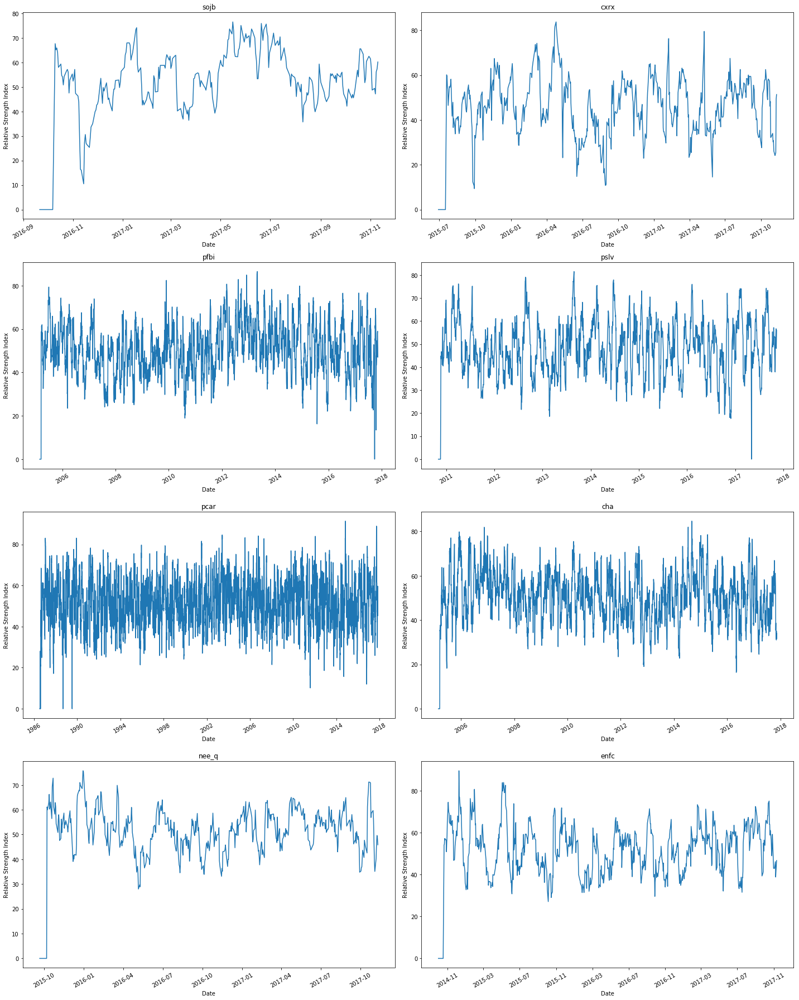

In [58]:
%matplotlib inline

# RSI Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['RSI_14D'])
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Relative Strength Index")
    plt.xticks(rotation=30)
fig.tight_layout()


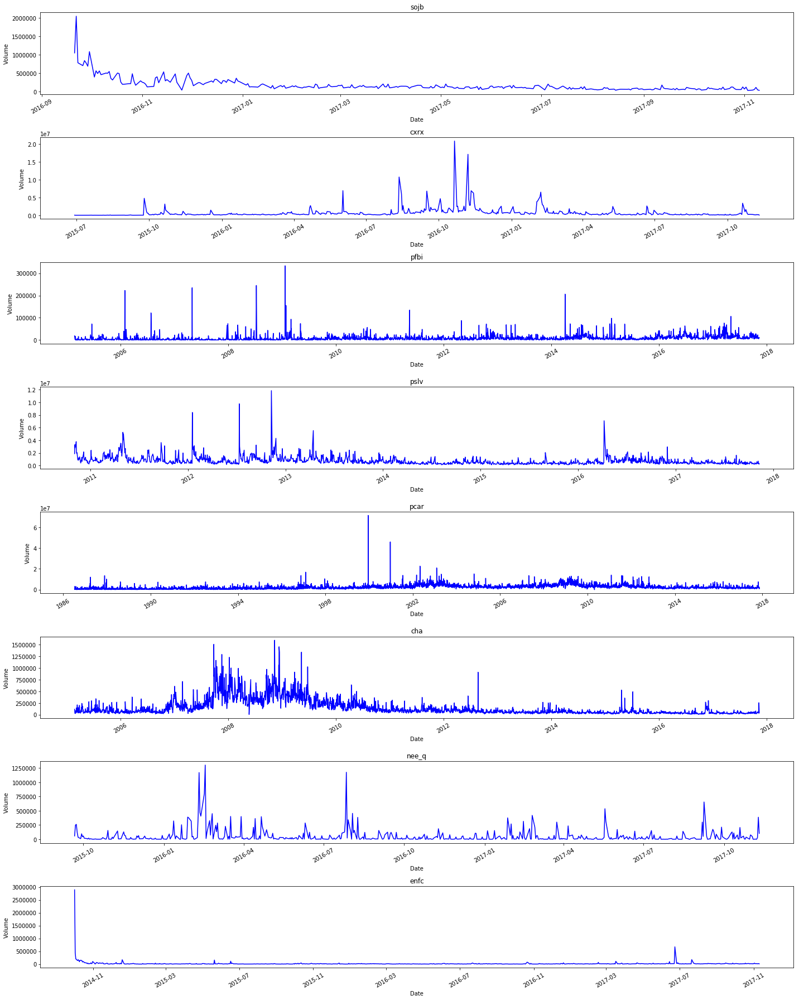

In [59]:
# Volume Plain plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume_plain'], 'b')
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Volume")
    plt.xticks(rotation=30)
fig.tight_layout()

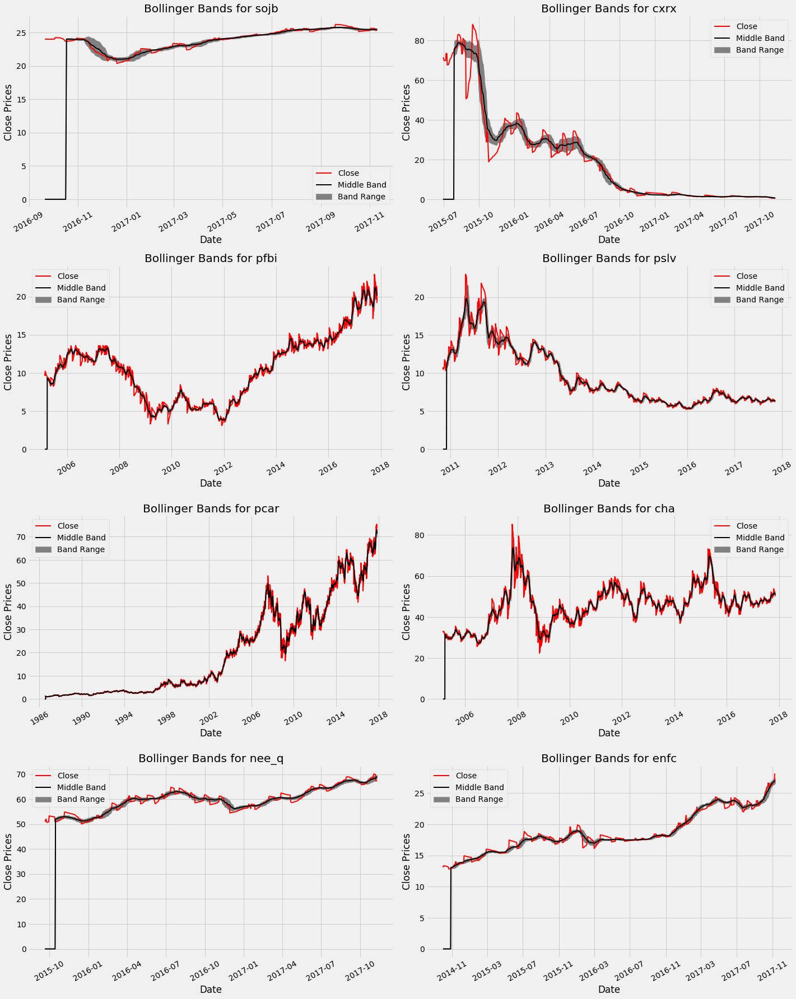

In [60]:
plt.style.use('fivethirtyeight')

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['BB_Upper_Band'], TechIndicator[i]['BB_Lower_Band'], color='grey', label="Band Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label="Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['BB_Middle_Band'], color='black', lw=2, label="Middle Band")
    ax.set_title("Bollinger Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()
#.dt.to_pydatetime()

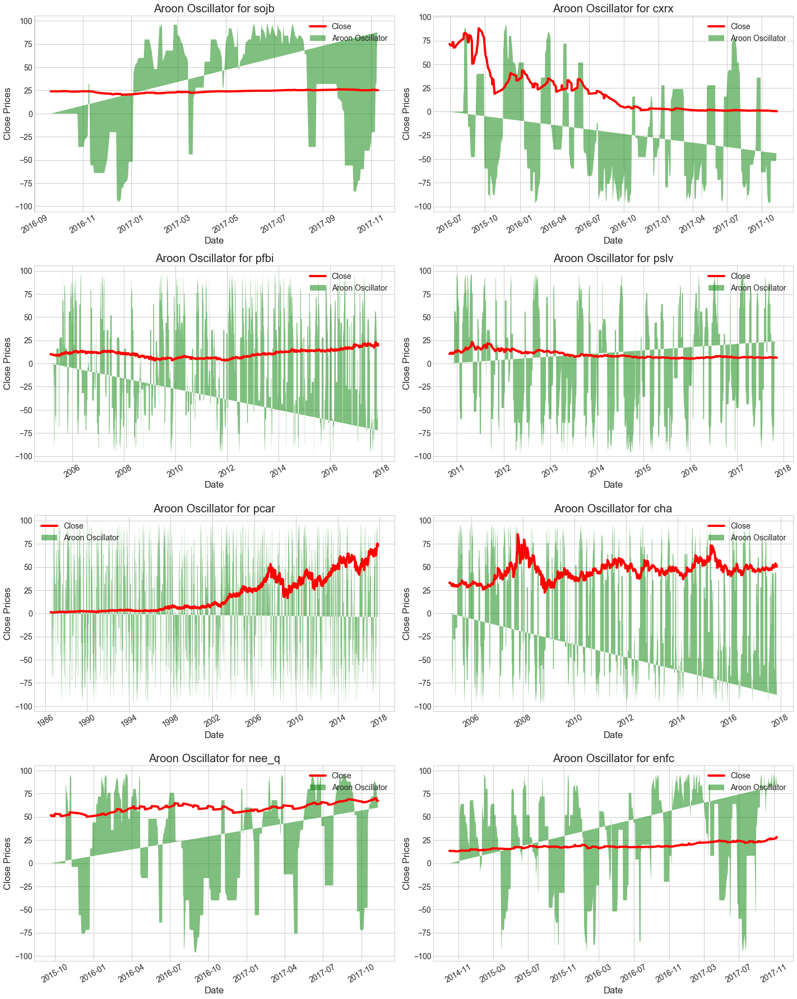

In [61]:
# Aroon Oscillator Plot
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill(TechIndicator[i].index, TechIndicator[i]['Aroon_Oscillator'],'g', alpha = 0.5, label = "Aroon Oscillator")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
    ax.set_title("Aroon Oscillator for " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

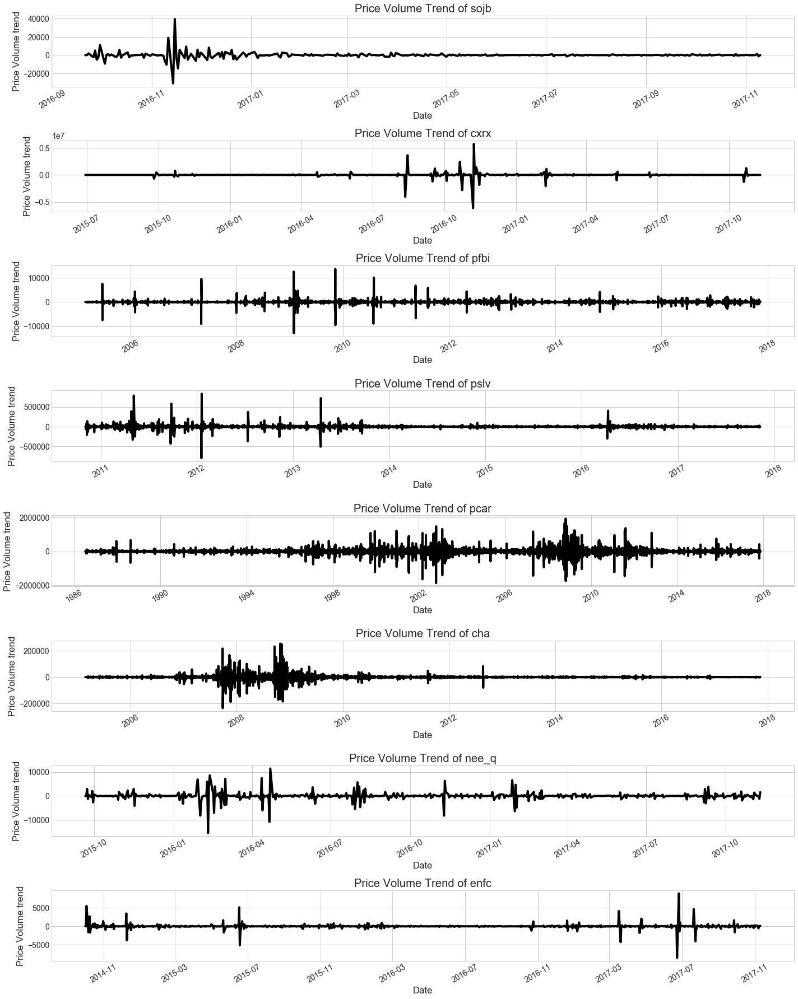

In [63]:
# PRice Volume Trend Plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['PVT'], 'black')
    ax.set_title("Price Volume Trend of " +str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Price Volume trend")
    plt.xticks(rotation=30)
fig.tight_layout()

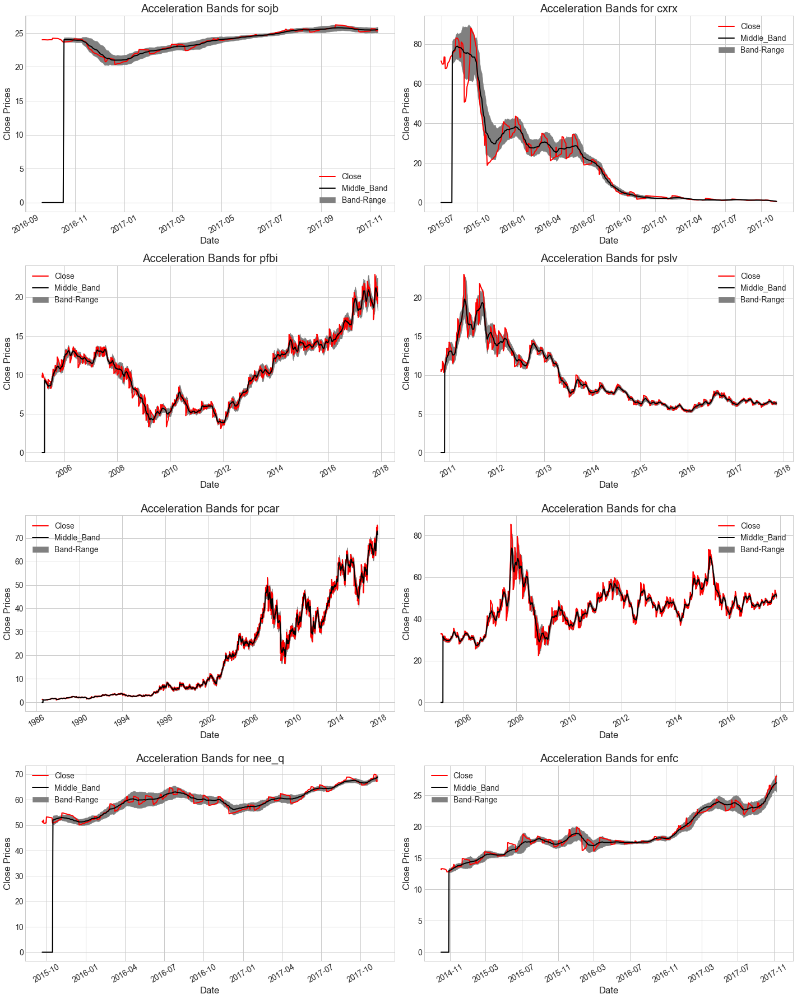

In [64]:
# Acceleration band Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['AB_Upper_Band'], TechIndicator[i]['AB_Lower_Band'], color='grey', label = "Band-Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label = "Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['AB_Middle_Band'], color='black', lw=2, label="Middle_Band")
    ax.set_title("Acceleration Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

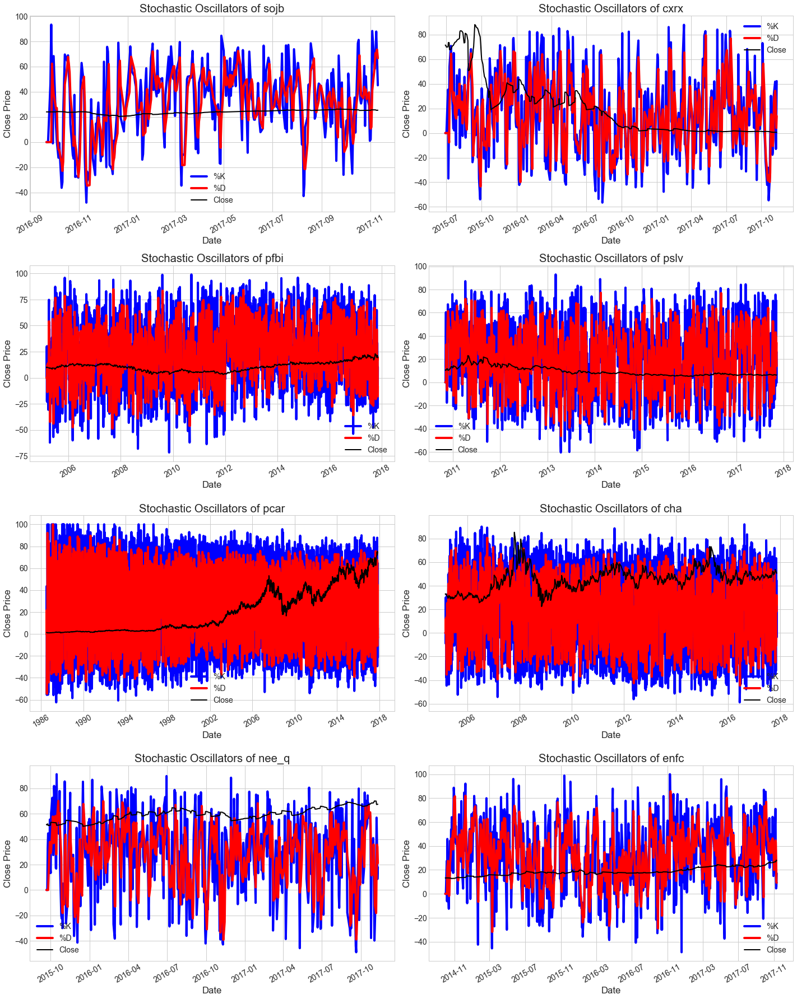

In [65]:
# Stochastic Oscillator plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOK'], 'blue', label="%K")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOD'], 'red', label="%D")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='black', lw=2, label = "Close")
    ax.set_title("Stochastic Oscillators of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/figure.py:2267: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


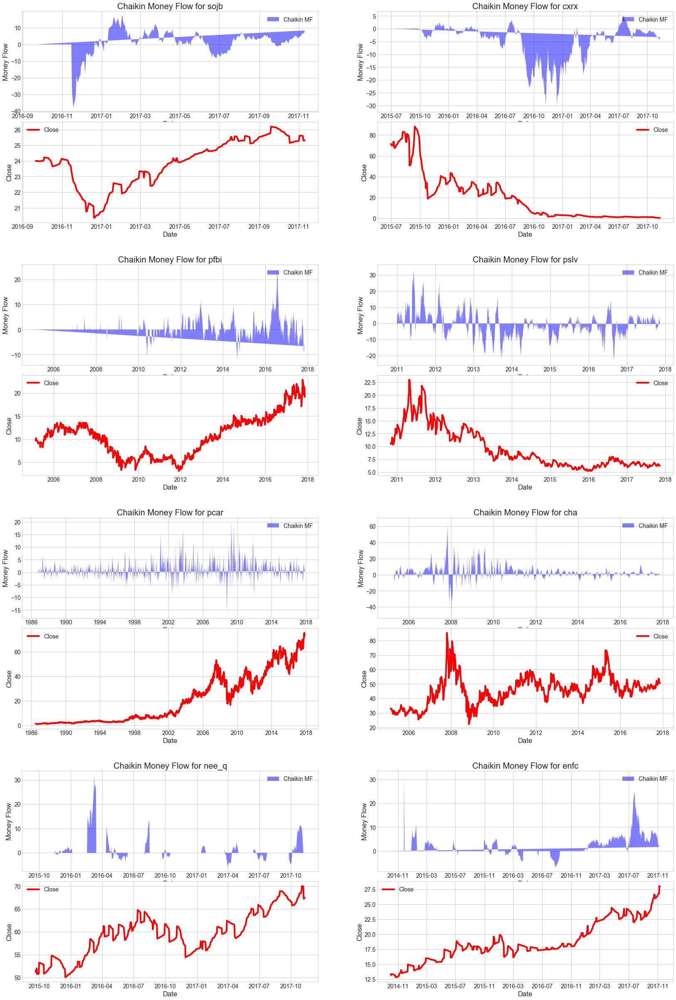

In [66]:
# Chaikin Money Flow Plots
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(25,40))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.1)

    for j in range(2):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.fill(TechIndicator[i].index, TechIndicator[i]['Chaikin_MF'],'b', alpha = 0.5, label = "Chaikin MF")
            ax.set_title("Chaikin Money Flow for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Money Flow")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
            t = ax.set_ylabel("Close")
        ax.legend()
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

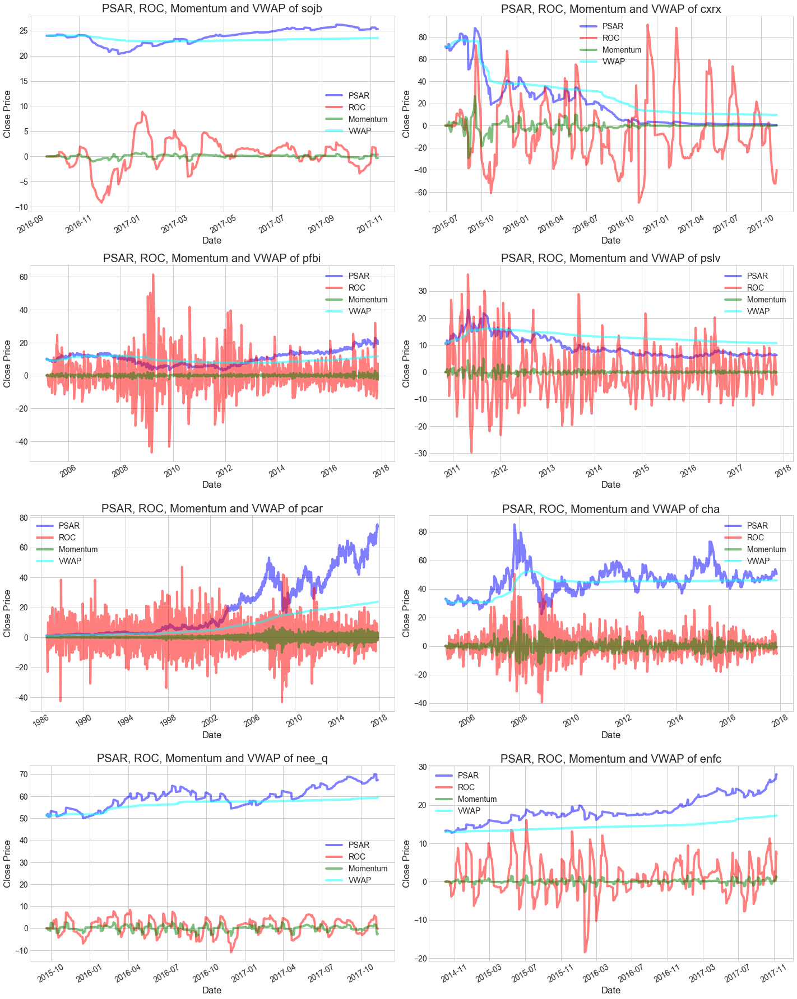

In [67]:
# Parabolic SAR, Rate of Change, Momentum and VWAP Plots
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['psar'], 'blue', label="PSAR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ROC'], 'red', label="ROC", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Momentum'], 'green', label="Momentum", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['VWAP'], 'cyan', label="VWAP", alpha = 0.5)
    ax.set_title("PSAR, ROC, Momentum and VWAP of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/figure.py:2267: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


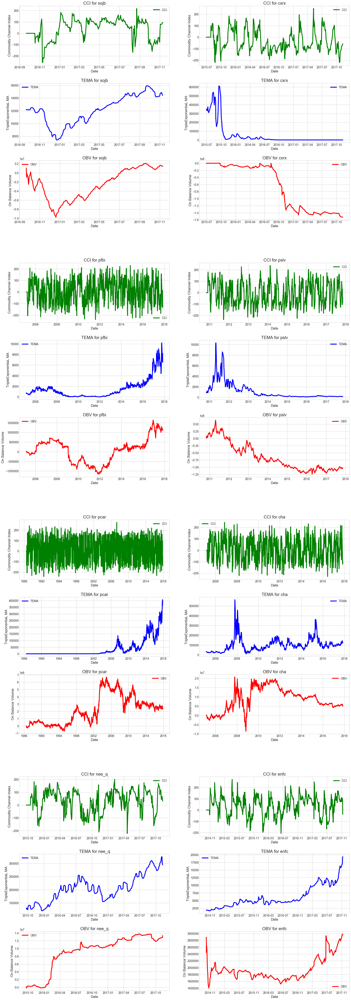

In [68]:
# Commodity Channel Index, Triple Exponential Moving Average On Banalance Volume Plots

fig = plt.figure(figsize=(25,80))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.3, hspace=0.3)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['CCI'], 'green', label="CCI")
            t = ax.set_title("CCI for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Commodity Channel Index")
        elif j == 1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['TEMA'], 'blue', label="TEMA")
            t = ax.set_title("TEMA for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("TripleExponentiaL MA")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['OBV'], 'red', label="OBV")
            t = ax.set_title("OBV for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("On Balance Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

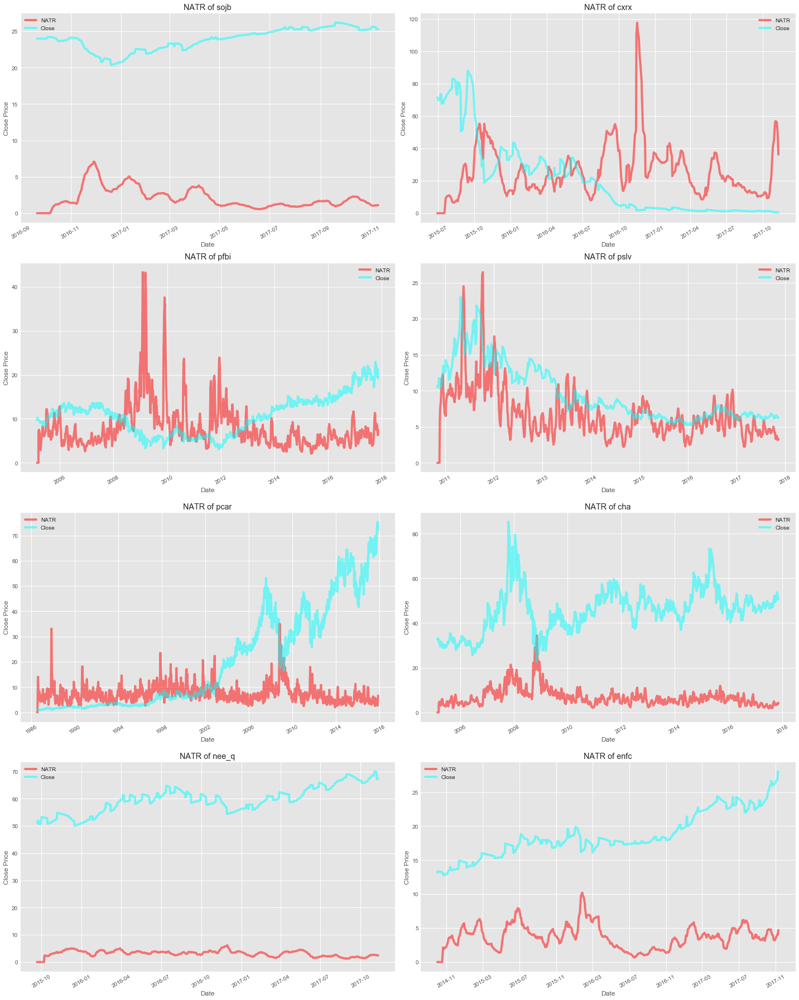

In [69]:
# Normalized Average True range Plots
plt.style.use('ggplot')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['NATR'], 'red', label="NATR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'cyan', label="Close", alpha = 0.5)
    ax.set_title("NATR of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

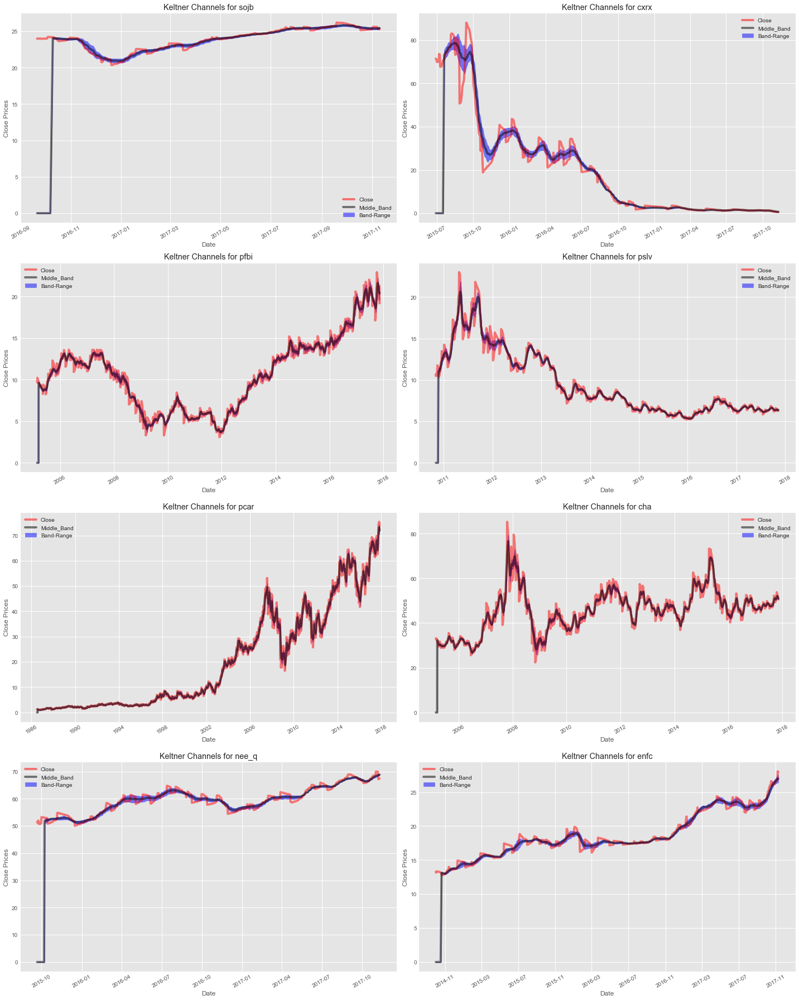

In [70]:
# Keltner Channels Plots

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['Kelch_Upper'], TechIndicator[i]['Kelch_Down'], 
                    color='blue', label = "Band-Range", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', label = "Close", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Kelch_Middle'], color='black', label="Middle_Band", alpha = 0.5)
    ax.set_title("Keltner Channels for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

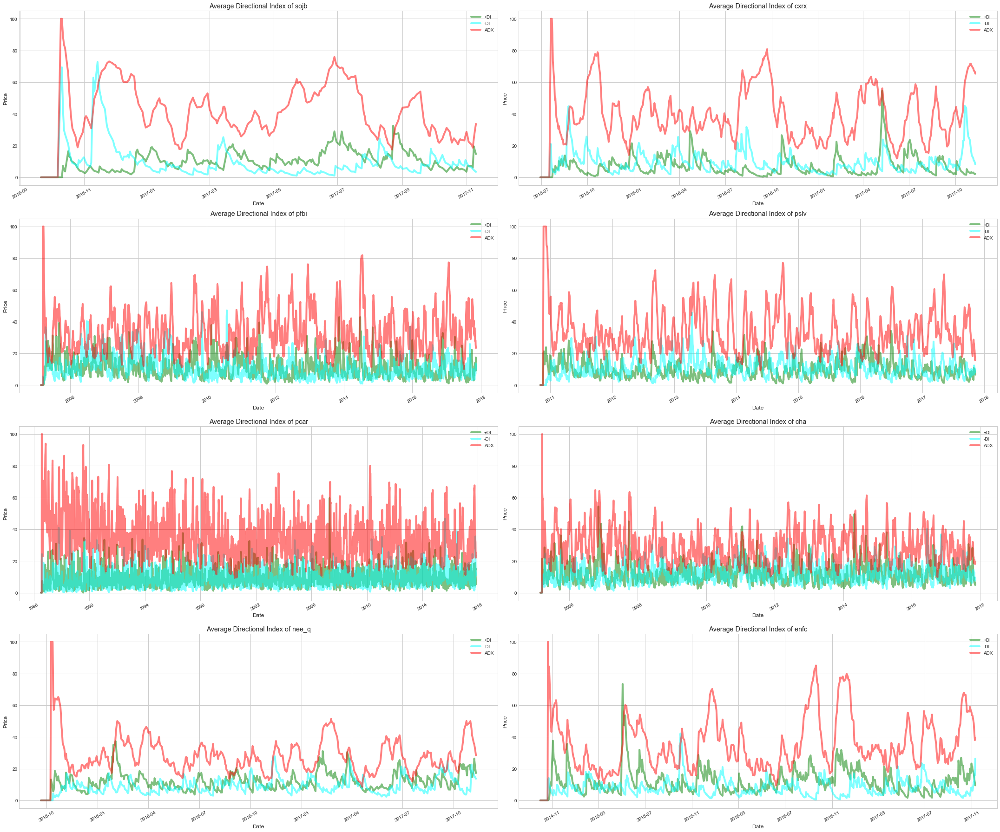

In [71]:
# Average Directional Index

plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(30,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['plusDI'], 'green', label="+DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['minusDI'], 'cyan', label="-DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ADX'], 'red', label="ADX", alpha = 0.5)
    ax.set_title("Average Directional Index of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

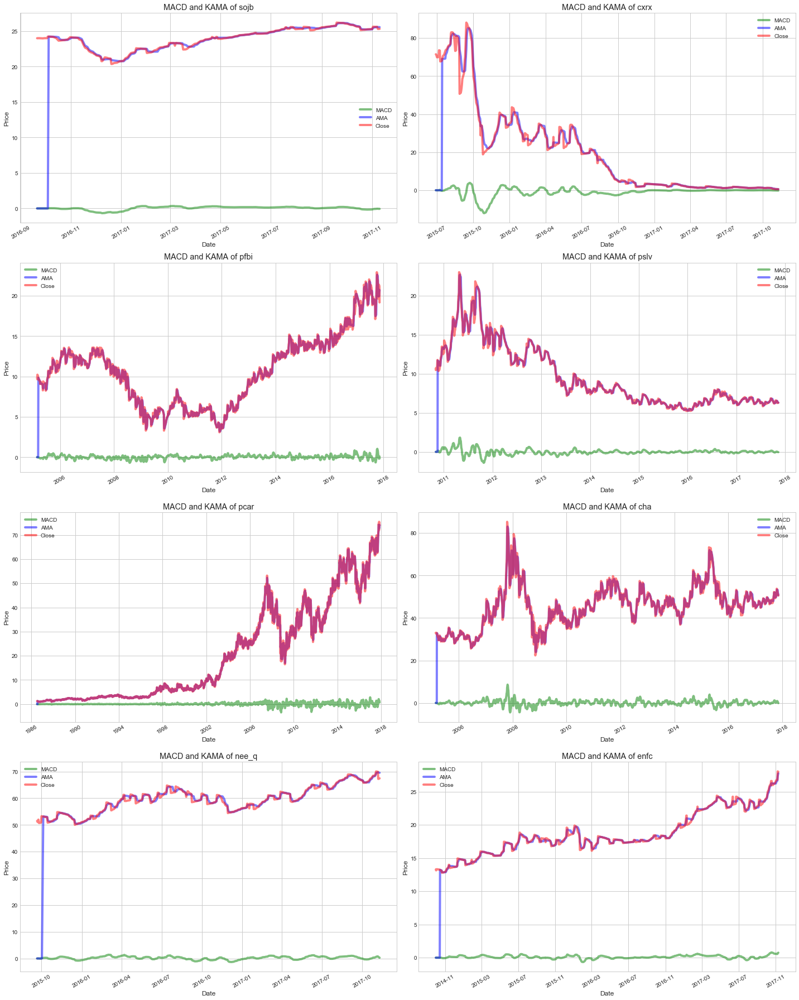

In [72]:
# Moving Average Convergence Divergence, Adaptive Moving Avergae Plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['MACD'], 'green', label="MACD", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['KAMA'], 'blue', label="AMA", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'red', label="Close", alpha = 0.5)
    ax.set_title("MACD and KAMA of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

/anaconda/lib/python3.6/site-packages/matplotlib/figure.py:2267: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


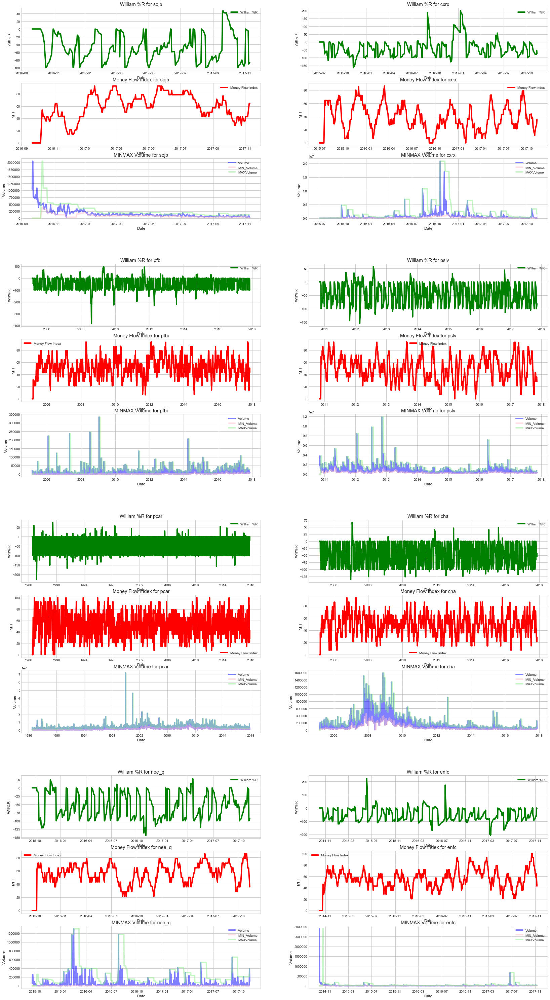

In [74]:
# William %R, Money Flow
fig = plt.figure(figsize=(25,50))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.2, hspace=0.2)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['WillR'], 'green', label="William %R")
            t = ax.set_title("William %R for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Will%R")
        elif j ==1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Money_Flow_Index'], 'red', label="Money Flow Index")
            
            t = ax.set_title("Money Flow Index for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("MFI")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume'], 'blue', label="Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MIN_Volume'], 'pink', label="MIN_Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MAX_Volume'], 'lightgreen', label="MAXVolume",  alpha = 0.5)
            t = ax.set_title("MINMAX Volume for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

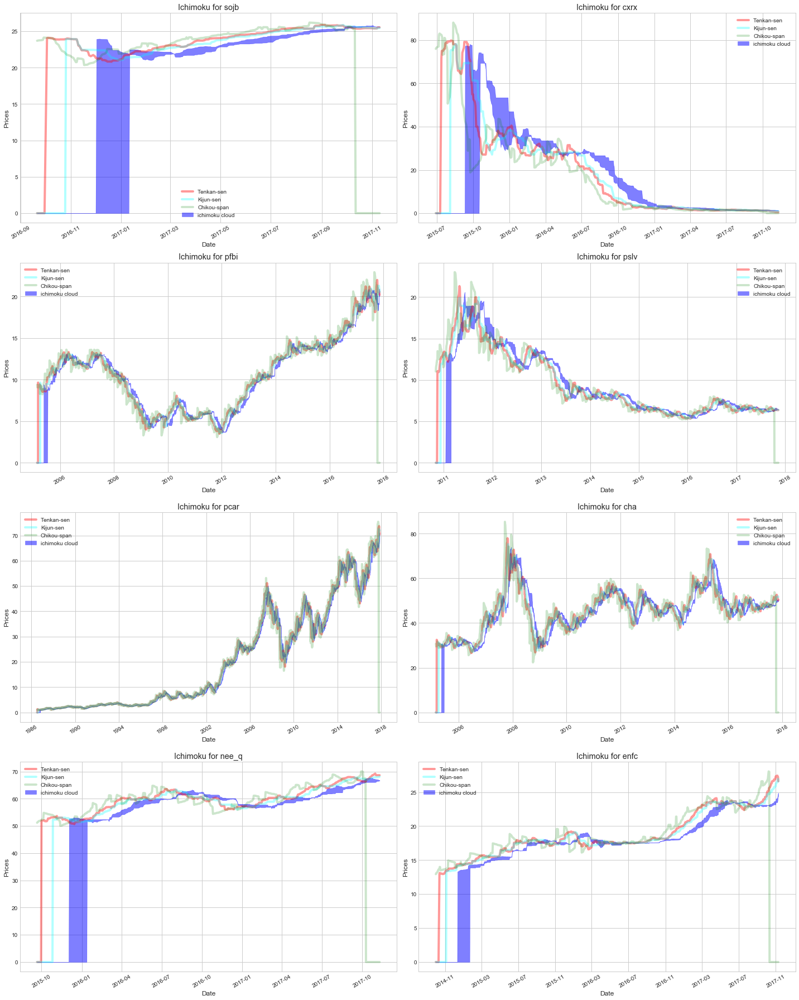

In [75]:
# ichimoku Plots turning_line	standard_line	ichimoku_span1	ichimoku_span2	chikou_span

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['ichimoku_span1'], TechIndicator[i]['ichimoku_span2'], 
                    color='blue', label = "ichimoku cloud", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['turning_line'], color='red', label = "Tenkan-sen", alpha = 0.4)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['standard_line'], color='cyan', label="Kijun-sen", alpha = 0.3)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['chikou_span'], color='green', label="Chikou-span", alpha = 0.2)
    ax.set_title("Ichimoku for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Prices")
    plt.xticks(rotation=30)
fig.tight_layout()